# **EDA for Data Enriched (Post-HMM)**

### The purpose of this file is to perform an exploratory analysis over the product of the HMM model, which added 2 new features to the dataset (`HMM_Regime_PCA` and `HMM_Regime_All`) and decrypt their nature and meaning to be able to use them in the next steps of the project.

# 0.0. Imports and Configurations

In [1]:
# Install project package

%pip install -q -e ..

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.3 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# Install dependency

%pip install -q boto3

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.3 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
# Libraries

import os
import sys
from dotenv import load_dotenv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns
from scipy.stats import kurtosis
from scipy.stats import skew
import scipy.stats as st
import warnings
import tqdm as tqdm

In [4]:
# Load environment variables

from dotenv import load_dotenv
from pathlib import Path

load_dotenv()

EDA_CONTENT_PATH = os.getenv("EDA_CONTENT_PATH")

In [5]:
# Load the module from configs package

from configs.load_enriched_data import load_data

In [6]:
# Load data

df = load_data()

In [7]:
df.sample(5)

,date,Close,High,Low,Open,Volume,Scaled_SMA20,Scaled_SMA50,Scaled_EMA20,Scaled_EMA50,...,OIL_close,TLT_close,RSP_close,TNX_close,IWM_close,UUP_close,MSTR_close,SPY_close,HMM_Regime_PCA,HMM_Regime_All
3274,2024-02-22,51304.972656,52009.613281,50926.292969,51854.644531,2.541390e+10,2766.413281,6193.626094,2148.200583,5293.380134,...,78.610001,84.201859,155.694183,4.327,194.582932,25.924694,71.315002,493.907837,PCA_Regime_2,Bullish_Regime
1857,2020-04-06,7271.781250,7271.781250,6782.889648,6788.049805,4.689690e+10,833.826221,-253.873262,589.230503,31.788258,...,26.080000,140.164719,77.777306,0.676,104.644661,23.535353,11.603000,243.470291,PCA_Regime_0,Bullish_Regime
3169,2023-11-09,36693.125000,37926.257812,35592.101562,35633.632812,3.776267e+10,2426.312695,6568.034883,2737.887451,5349.147265,...,75.739998,78.779442,133.548264,4.630,162.571060,25.968904,49.407001,420.515717,PCA_Regime_0,Bullish_Regime
1598,2019-07-22,10343.106445,10651.791016,10154.921875,10596.948242,1.633441e+10,-738.245264,179.468896,-413.655352,212.106045,...,56.220001,108.386307,96.470703,2.043,141.217987,22.262054,12.225000,269.663971,PCA_Regime_2,Consolidation_Regime
2019,2020-09-15,10796.951172,10938.631836,10656.459961,10677.754883,3.250945e+10,-8.440234,-483.347441,52.011974,-27.583968,...,38.279999,137.659607,100.855278,0.679,142.978104,21.673214,15.575000,314.074402,PCA_Regime_2,Consolidation_Regime


# 1.0. Missing Values Count

Missing values count: 35278
------------------------------------------------------------


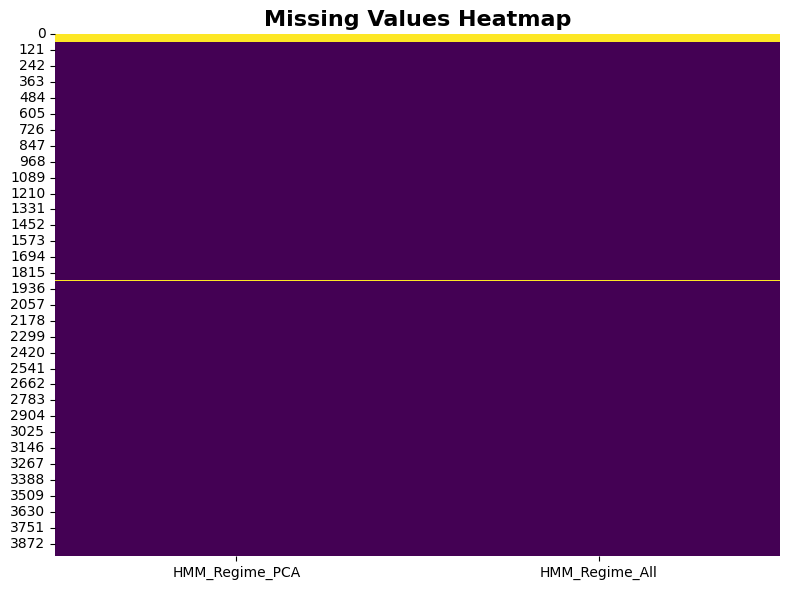

In [8]:
# Missing values count

print(f"Missing values count: {df.isnull().sum().sum()}")

print("--" * 30)

# Null values Heatmap for "HMM_Regime_PCA" and "HMM_Regime_All"

plt.figure(figsize = (8, 6))
sns.heatmap(df[["HMM_Regime_PCA", "HMM_Regime_All"]].isnull(), cbar = False, cmap = 'viridis')
plt.title('Missing Values Heatmap', fontsize = 16, fontweight = 'bold')
plt.tight_layout()

# Save

plt.savefig(os.path.join(EDA_CONTENT_PATH, 'post_HMM_missing_values_heatmap.png'), dpi = 300)

plt.show()

# 2.0. HMM Regime Variables Analysis

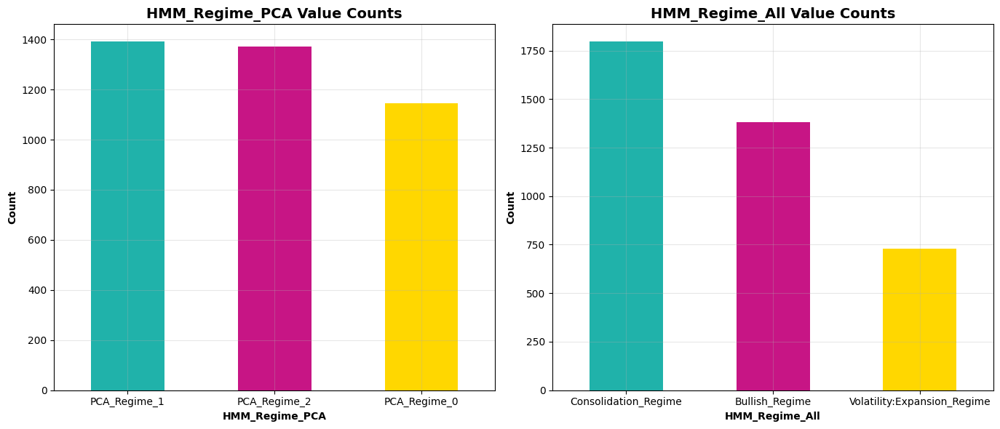

In [9]:
# Select the proper columns

cols_HMM = ["HMM_Regime_PCA", "HMM_Regime_All"]
colors = ["lightseagreen", "mediumvioletred", "gold"]

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (14, 6))

for i, col in enumerate(cols_HMM):

    df[col].value_counts().plot(kind = "bar", ax = axes[i], color = colors)
    axes[i].set_title(f"{col} Value Counts", fontsize = 14, fontweight = "bold")
    axes[i].set_xlabel(col, fontsize = 10, fontweight = "bold")
    axes[i].set_ylabel("Count", fontsize = 10, fontweight = "bold")
    axes[i].tick_params(axis = "x", rotation = 0)
    axes[i].grid(alpha = 0.3)

plt.tight_layout()

# Save

plt.savefig(os.path.join(EDA_CONTENT_PATH, "post_HMM_regime_histograms.png"), dpi = 300)
plt.show()

# 3.0. Categorical Variables against HMM Regime Variables

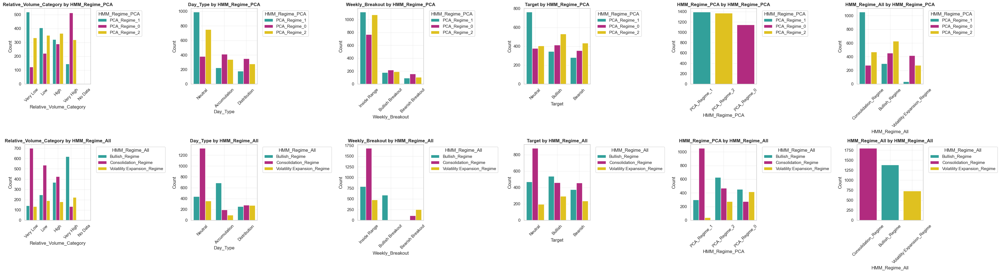

In [10]:
# Categorical Variables against HMM Regime Variables

sns.set_theme(style="whitegrid")

cols_HMM = ["HMM_Regime_PCA", "HMM_Regime_All"]
cols_cat = df.select_dtypes(include = ["object", "category"]).columns.tolist()

colors = ["lightseagreen", "mediumvioletred", "gold"]

# Drop the date from the list

if "date" in cols_cat:

    cols_cat.remove("date")

# Create a grid of subplots

fig, axes = plt.subplots(nrows = len(cols_HMM), ncols = len(cols_cat), figsize = (6 * len(cols_cat), 5 * len(cols_HMM)))

if len(cols_HMM) == 1 and len(cols_cat) == 1:

    axes = np.array([[axes]])

elif len(cols_HMM) == 1:

    axes = axes.reshape(1, -1)

elif len(cols_cat) == 1:

    axes = axes.reshape(-1, 1)

for i, hmm_col in enumerate(cols_HMM):

    for j, cat_col in enumerate(cols_cat):

        sns.countplot(
            data = df, x = cat_col, hue = hmm_col, ax = axes[i, j], palette = colors, order = df[cat_col].value_counts().index
        )
        axes[i, j].set_title(f'{cat_col} by {hmm_col}', fontsize = 12, fontweight = 'bold')
        axes[i, j].set_xlabel(cat_col)
        axes[i, j].set_ylabel('Count')
        axes[i, j].tick_params(axis = 'x', rotation = 45)
        axes[i, j].grid(alpha = 0.3)
        
        # Legend outside the plot

        axes[i, j].legend(title = hmm_col, bbox_to_anchor = (1.05, 1), loc = 'upper left')

plt.tight_layout()

# Save

plt.savefig(os.path.join(EDA_CONTENT_PATH, 'post_HMM_categorical_distributions.png'), 
            dpi = 300, bbox_inches = 'tight')
plt.show()

# 4.0. Persistence and Regime Duration Analysis

# 4.4. Transition Matrix for PCA-based HMM Regime

In [11]:
# Transition Matrix for PCA-based HMM Regime

trans_mat_PCA = pd.crosstab(df["HMM_Regime_PCA"], df["HMM_Regime_PCA"].shift(1), normalize = "index")

print("Transition Matrix for HMM_Regime_PCA:")
print("--" * 40)
display(trans_mat_PCA.round(2))
print("--" * 40)
print("\nAverage Persistence by Regime (days):")
print((1 / (1 - np.diag(trans_mat_PCA))).round(1))

Transition Matrix for HMM_Regime_PCA:
--------------------------------------------------------------------------------


HMM_Regime_PCA,PCA_Regime_0,PCA_Regime_1,PCA_Regime_2
HMM_Regime_PCA,,,
PCA_Regime_0,0.59,0.22,0.19
PCA_Regime_1,0.18,0.81,0.02
PCA_Regime_2,0.17,0.01,0.82


--------------------------------------------------------------------------------

Average Persistence by Regime (days):
[2.4 5.1 5.6]


# 4.2. Transtion Matrix for All-Feature HMM Regime

In [12]:
# Transition Matrix for All-Feature HMM REgime

trans_mat_All = pd.crosstab(df["HMM_Regime_All"], df["HMM_Regime_All"].shift(1), normalize = "index")

print("Transition Matrix for HMM Regime All Features:")
print("--" * 40)
display(trans_mat_All.round(2))
print("--" * 40)
print("\nAverage Persistence by Regime (days):")
print((1 / (1 - np.diag(trans_mat_All))).round(1))

Transition Matrix for HMM Regime All Features:
--------------------------------------------------------------------------------


HMM_Regime_All,Bullish_Regime,Consolidation_Regime,Volatility:Expansion_Regime
HMM_Regime_All,,,
Bullish_Regime,0.76,0.19,0.05
Consolidation_Regime,0.14,0.76,0.11
Volatility:Expansion_Regime,0.12,0.24,0.64


--------------------------------------------------------------------------------

Average Persistence by Regime (days):
[4.1 4.1 2.8]


# 5.0. Profiling HMM and Grouping by Regime and Other Variables

In [13]:
# Keys for groiping

key = ["Close", "Norm_ATR", "ILV", "Volume", "RSI", "Momentum_20p", "VIX_close"]

# 5.1. Profiling by PCA-based HMM Regime

In [14]:
# For PCA-based HMM

profile = df.loc[df.index].copy()

profile["regime"] = profile["HMM_Regime_PCA"]

print("Profiling by PCA-based HMM Regime:")
print("--" * 50)
print("Average by Regime")
display(profile.groupby("regime")[key].mean().round(2))
print("--" * 50)
display(profile.groupby("regime")[key].median().round(2))
print("--" * 50)
print("Frequency by Regime (%):")
display(profile["regime"].value_counts(normalize = True).round(3))

Profiling by PCA-based HMM Regime:
----------------------------------------------------------------------------------------------------
Average by Regime


,Close,Norm_ATR,ILV,Volume,RSI,Momentum_20p,VIX_close
regime,,,,,,,
PCA_Regime_0,28775.54,0.05,0.06,3.050902e+10,53.69,457.78,21.26
PCA_Regime_1,20357.51,0.03,0.02,1.237480e+10,55.16,332.10,16.49
PCA_Regime_2,36930.59,0.05,0.05,2.733864e+10,53.41,598.09,16.38


----------------------------------------------------------------------------------------------------


,Close,Norm_ATR,ILV,Volume,RSI,Momentum_20p,VIX_close
regime,,,,,,,
PCA_Regime_0,20115.58,0.04,0.05,2.795045e+10,52.77,64.24,19.70
PCA_Regime_1,7400.90,0.03,0.02,1.001486e+10,54.83,19.22,14.78
PCA_Regime_2,22939.40,0.05,0.04,2.549315e+10,52.42,242.47,16.27


----------------------------------------------------------------------------------------------------
Frequency by Regime (%):


regime
PCA_Regime_1    0.356
PCA_Regime_2    0.351
PCA_Regime_0    0.293
Name: proportion, dtype: float64

# 5.2. Profiling by All-Feature HMM Regime

In [15]:
# For All-Feature HMM

profile = df.loc[df.index].copy()

profile["regime"] = profile["HMM_Regime_All"]

print("Profiling by All-Feature HMM Regime:")
print("--" * 50)
print("Average by Regime")
display(profile.groupby("regime")[key].mean().round(2))
print("--" * 50)
display(profile.groupby("regime")[key].median().round(2))
print("--" * 50)
print("Frequency by Regime (%):")
display(profile["regime"].value_counts(normalize = True).round(3))

Profiling by All-Feature HMM Regime:
----------------------------------------------------------------------------------------------------
Average by Regime


,Close,Norm_ATR,ILV,Volume,RSI,Momentum_20p,VIX_close
regime,,,,,,,
Bullish_Regime,27987.81,0.04,0.05,2.529824e+10,69.63,3371.88,17.21
Consolidation_Regime,30908.25,0.03,0.02,1.856226e+10,48.92,-460.59,17.64
Volatility:Expansion_Regime,24295.24,0.07,0.08,2.925748e+10,37.54,-2775.56,21.89


----------------------------------------------------------------------------------------------------


,Close,Norm_ATR,ILV,Volume,RSI,Momentum_20p,VIX_close
regime,,,,,,,
Bullish_Regime,11338.75,0.04,0.04,2.234608e+10,70.20,1416.60,15.99
Consolidation_Regime,19052.58,0.03,0.02,1.643067e+10,48.87,-11.12,16.18
Volatility:Expansion_Regime,11177.10,0.06,0.06,2.579304e+10,36.77,-1589.47,19.49


----------------------------------------------------------------------------------------------------
Frequency by Regime (%):


regime
Consolidation_Regime           0.460
Bullish_Regime                 0.354
Volatility:Expansion_Regime    0.187
Name: proportion, dtype: float64

# 6.0. Against the Target Variable

## Baseline: 

### - Neutral: 39.5%
### - Bullish: 33.0%
### - Bearish: 27.4%

# 6.1. PCA-based HMM Regime vs Target Variable

In [16]:
# Crosstab for PCA-based HMM Regime vs Target Variable

ct_PCA = pd.crosstab(df["HMM_Regime_PCA"], df["Target"], normalize = "index")

display(ct_PCA.round(2))

Target,Bearish,Bullish,Neutral
HMM_Regime_PCA,,,
PCA_Regime_0,0.31,0.36,0.33
PCA_Regime_1,0.20,0.25,0.55
PCA_Regime_2,0.32,0.39,0.30


# 6.2. All-Feature HMM Regime vs Target Variable

In [17]:
# Crosstab for PCA-based HMM Regime vs Target Variable

ct_All = pd.crosstab(df["HMM_Regime_All"], df["Target"], normalize = "index")

display(ct_All.round(2))

Target,Bearish,Bullish,Neutral
HMM_Regime_All,,,
Bullish_Regime,0.27,0.39,0.34
Consolidation_Regime,0.26,0.26,0.49
Volatility:Expansion_Regime,0.33,0.40,0.27


# 7.0. Numerical Distribution by HMM Regime (both PCA and All-Feature)

In [18]:
# Numerical columns

col_nums = df.select_dtypes(include = ["float64", "int64"]).columns

# Colors

colors = ["lightseagreen", "mediumvioletred", "gold"]

# 7.1. Numerical Distribution by PCA-based HMM Regime

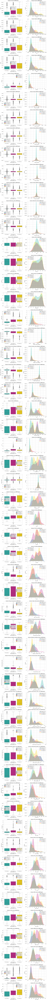

In [19]:
# Density graphics and histogram with respect to the target variable "HMM_Regime_PCA"

if True:

    fig, axes = plt.subplots(nrows = len(col_nums), ncols = 2, figsize = (12, 4.5 * len(col_nums)))

    if len(col_nums) == 1:

        axes = axes.reshape(1, 2)

    for i, col in enumerate(col_nums):

        sns.kdeplot(data = df, x = col, hue = 'HMM_Regime_PCA', palette = colors, fill = True, ax = axes[i, 1], warn_singular = False)
        axes[i, 1].set_title(f"Density of {col} by HMM Regime", fontweight = 'bold')

        sns.boxplot(data = df, x = 'HMM_Regime_PCA', y = col, hue = 'HMM_Regime_PCA', palette = colors, ax = axes[i, 0])
        axes[i, 0].set_title(f"Boxplot of {col} by HMM Regime", fontweight = 'bold')
        
    plt.tight_layout()

    # Save

    plt.savefig(os.path.join(EDA_CONTENT_PATH, 'post_HMM_PCA_numerical_features_by_target.png'), dpi = 300)

    plt.show()

# 7.2. Numerical Distribution by All-Feature HMM Regime

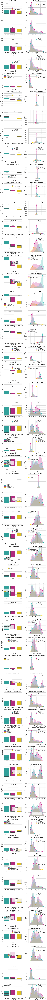

In [20]:
# Density graphics and histogram with respect to the target variable "HMM_Regime_All"

if True:

    fig, axes = plt.subplots(nrows = len(col_nums), ncols = 2, figsize = (12, 4.5 * len(col_nums)))

    if len(col_nums) == 1:

        axes = axes.reshape(1, 2)

    for i, col in enumerate(col_nums):

        sns.kdeplot(data = df, x = col, hue = 'HMM_Regime_All', palette = colors, fill = True, ax = axes[i, 1], warn_singular = False)
        axes[i, 1].set_title(f"Density of {col} by HMM Regime", fontweight = 'bold')

        sns.boxplot(data = df, x = 'HMM_Regime_All', y = col, hue = 'HMM_Regime_All', palette = colors, ax = axes[i, 0])
        axes[i, 0].set_title(f"Boxplot of {col} by HMM Regime", fontweight = 'bold')
        
    plt.tight_layout()

    # Save

    plt.savefig(os.path.join(EDA_CONTENT_PATH, 'post_HMM_All_numerical_features_by_target.png'), dpi = 300)

    plt.show()